# Exploratory Data Analysis

#### Getting basic information from the data
    
$\bullet$ Look at number of observations, number of columns and features included in the dataset

$\bullet$ Check whether there are missing values in the dataset

#### Data cleaning and data exploration

$\bullet$ Look at statistical summary and distribution of numerical features

$\bullet$ Identify and modify outliers using boxplot and the 1.5 IQR rule

$\bullet$ Remove features that do not contain information, for example client ID

$\bullet$ Log transform features that are skewed

$\bullet$ Visualize the relationships between features and label as well as relationships between features and features using pair plot

#### Feature Engineering

$\bullet$ One-hot encode categorical features to include them in the model

$\bullet$ create new features to capture average amount and distribution of certain features

#### Hypothesis Testing
* Test of normality
* Coefficient t-test

Data Source: https://www.kaggle.com/sakshigoyal7/credit-card-customers?select=BankChurners.csv

In [1]:
import os 
import numpy as np
import pandas as pd
import seaborn as sns
import math
import matplotlib.pyplot as plt
from scipy import stats

In [2]:
%pylab inline
%config InlineBackend.figure_formats = ['retina']

Populating the interactive namespace from numpy and matplotlib


## Data Summary

In [4]:
os.getcwd()

'/Users/alessahuang/Desktop/IBM ml/Course 1 EDA/project_credit card'

In [3]:
# read csv file, ignore the last two column following the instruction of this dataset
data = pd.read_csv('/Users/alessahuang/Desktop/IBM ml/Course 1 EDA/project_credit card/BankChurners.csv')
data.drop(columns = [data.columns[len(data.columns) - 1], data.columns[len(data.columns) - 2]], inplace = True)

In [6]:
# look at the data info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [7]:
# check for null values
data.isnull().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [8]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


## Data Cleaning and Exploratory Analysis

### Numerical Features

In [7]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10127.0,4.632596e+01,8.016814e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


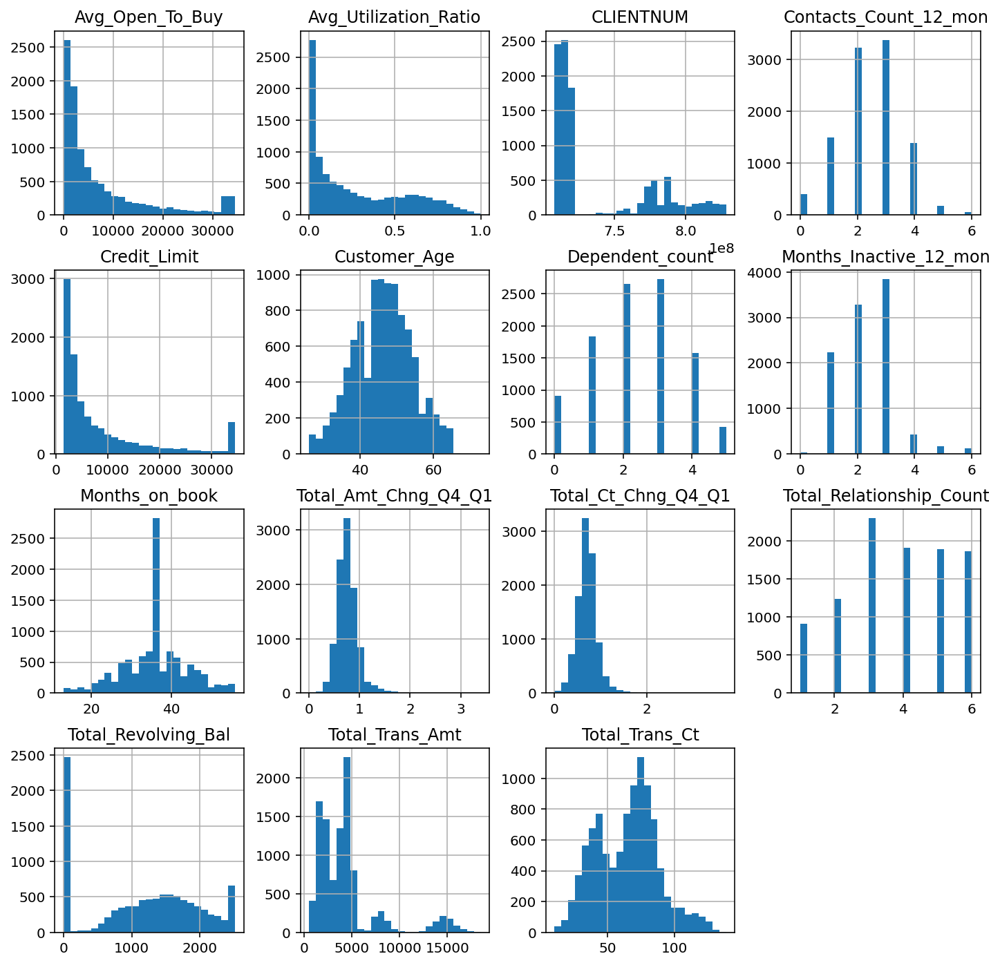

In [11]:
# distribution of numerical features
axList = data.hist(bins=25, figsize = (12, 12))
plt.savefig("Hist.png")

In [12]:
# make boxplot to identify outliers
tmc = data['Total_Amt_Chng_Q4_Q1']
tcc = data['Total_Ct_Chng_Q4_Q1']

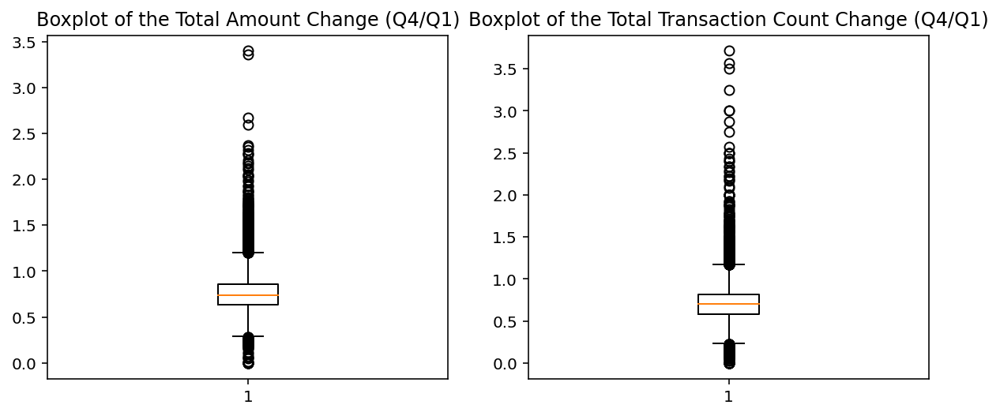

<Figure size 432x288 with 0 Axes>

In [13]:
# plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 4))

ax1.boxplot(tmc)
ax1.set_title('Boxplot of the Total Amount Change (Q4/Q1)')
ax2.boxplot(tcc)
ax2.set_title('Boxplot of the Total Transaction Count Change (Q4/Q1)')
plt.show()
plt.savefig('box.png')

In [14]:
def bounds(x):
    '''
    This funciton finds the lower and upper bounds for outliers in an array using the
    1.5IQR rule
    Input: x(array)
    Output: IQR, lower bound, upper bound
    '''
    q1 = np.quantile(x, 0.25)
    q3 = np.quantile(x, 0.75)
    iqr = q3 - q1
    # finding upper and lower whiskers
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    
    return [iqr, lower, upper]

In [15]:
# using the 1.5 IQR rule to find outliers
(tmc_iqr, tmc_lo, tmc_up) = bounds(tmc)
(tcc_iqr, tcc_lo, tcc_up) = bounds(tcc)

In [16]:
# trimmed values
tmc = tmc.apply(lambda x: tmc_up if x > tmc_up else (tmc_lo if x < tmc_lo else x) )
tcc = tcc.apply(lambda x: tcc_up if x > tcc_up else (tcc_lo if x < tcc_lo else x) )

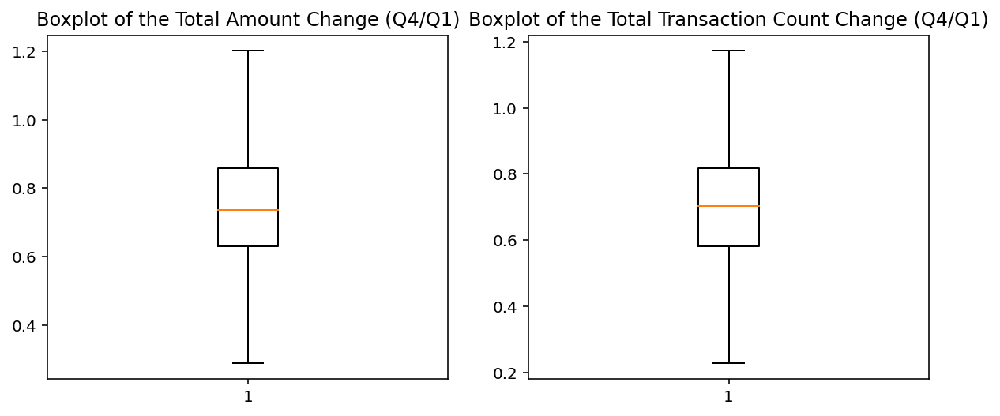

In [17]:
# plot after trimmed
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 4))

ax1.boxplot(tmc)
ax1.set_title('Boxplot of the Total Amount Change (Q4/Q1)')
ax2.boxplot(tcc)
ax2.set_title('Boxplot of the Total Transaction Count Change (Q4/Q1)')
plt.show()


In [18]:
# replace the original data with trimmed values
data['Total_Amt_Chng_Q4_Q1'] = tmc
data['Total_Ct_Chng_Q4_Q1'] = tcc

In [19]:
data.shape

(10127, 21)

In [20]:
# Remove the customer number
data.drop(columns = ['CLIENTNUM'], inplace = True)

### Seperate labels and features

In [21]:
Y = data['Attrition_Flag']
X = data.drop(columns = ['Attrition_Flag'])

### Log Transform Skewed Variables

In [22]:
# Create a list of float colums to check for skewing
mask = X.dtypes == np.float
float_cols = X.columns[mask]
float_cols

Index(['Credit_Limit', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
       'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [23]:
# define a limit of skew above which we will doing log transform
skew_limit = 0.75
skew_val = X[float_cols].skew()

In [24]:
# skewed columns
skew_cols = (skew_val
             .sort_values(ascending = False)
             .to_frame()
             .rename(columns = {0: 'Skew'})
             .query('abs(Skew) > {}'.format(skew_limit))
            )
skew_cols

,Skew
Credit_Limit,1.666726
Avg_Open_To_Buy,1.661697


In [25]:
# log transform
for col in skew_cols.index:
    X[col] = X[col].apply(np.log1p)

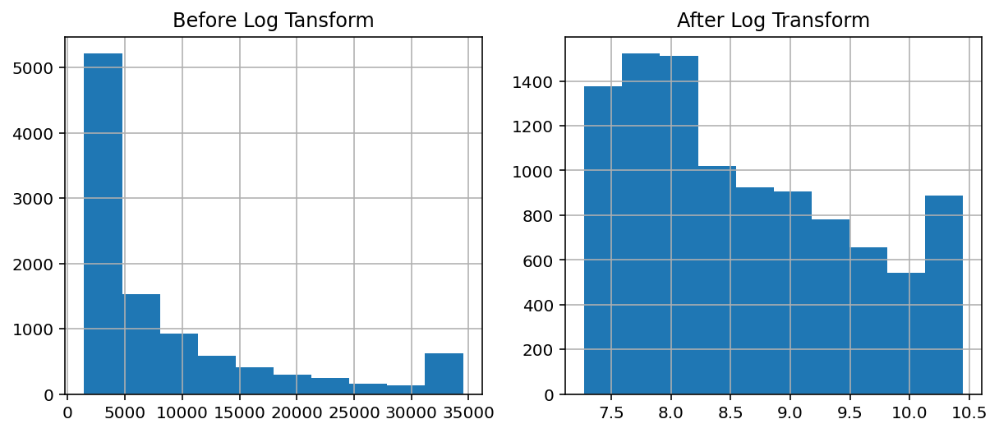

In [26]:
# plot credit limti after log transformation
# plot after trimmed
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 4))

X['Credit_Limit'].hist(ax = ax2)
ax2.set_title('After Log Transform')
data['Credit_Limit'].hist(ax = ax1)
ax1.set_title('Before Log Tansform')
plt.show()



### Pair Plot

In [27]:
# replace existing customer with 0 and attrited customer with 1
Ynum = data['Attrition_Flag'].replace(['Existing Customer', 'Attrited Customer'], [0, 1])

In [28]:
data_xy = X.copy()
data_xy['Attrition_Flag'] = Ynum

In [29]:
data_xy.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,9.448727,777,9.385553,1.201,1144,42,1.172,0.061,0
1,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,9.018817,864,8.908289,1.201,1291,33,1.172,0.105,0
2,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,8.137103,0,8.137103,1.201,1887,20,1.172,0.000,0
3,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,8.105911,2517,6.680855,1.201,1171,20,1.172,0.760,0
4,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,8.458928,0,8.458928,1.201,816,28,1.172,0.000,0


In [175]:
# create subsets of data 
subdata1 = data_xy.loc[:,['Customer_Age',
 'Gender',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Attrition_Flag']]

subdata3 = data_xy.loc[:, ['Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio',
 'Attrition_Flag']]

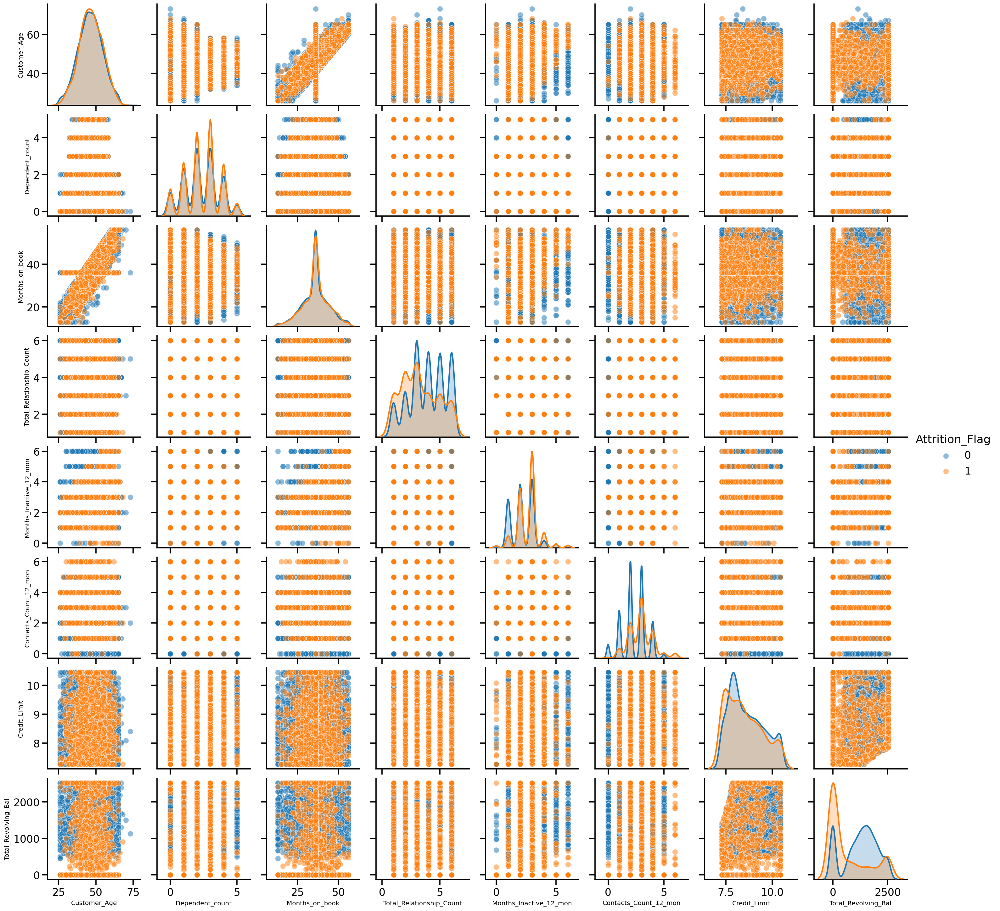

In [176]:
sns.set_context("talk", rc={"axes.labelsize":10})
sns.pairplot(subdata1, hue='Attrition_Flag', plot_kws = {'alpha': 0.5});
plt.savefig('pair1.png')

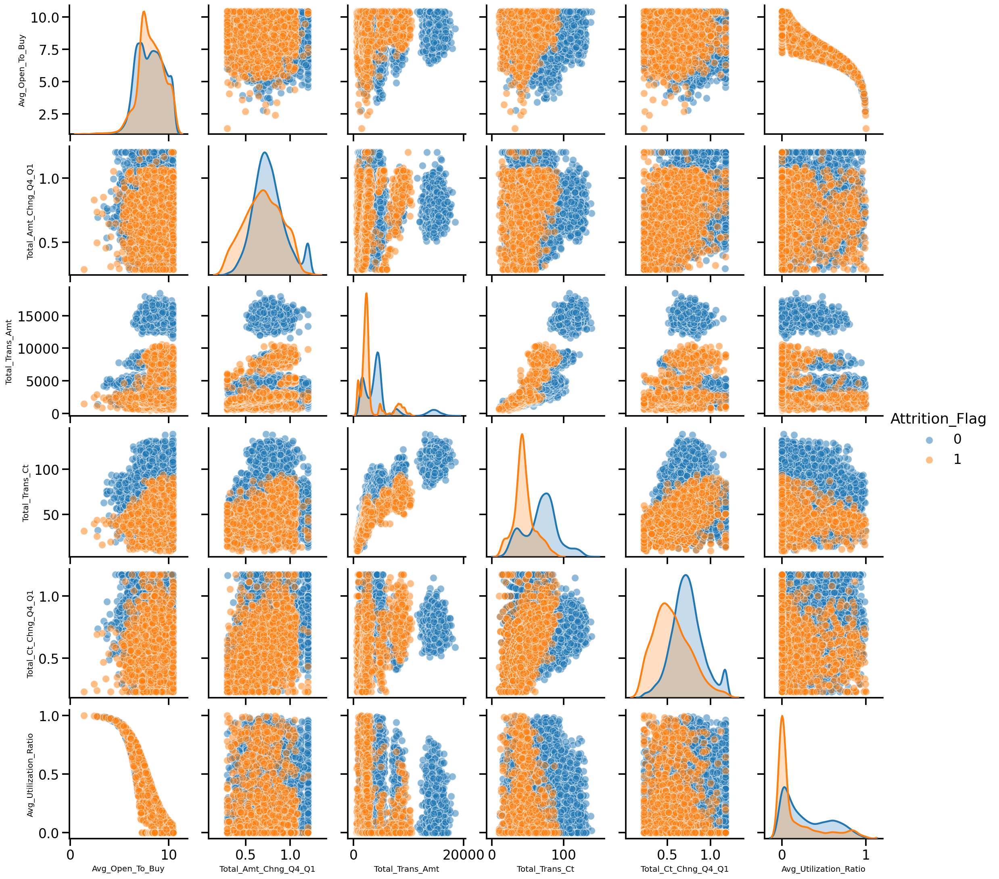

In [174]:
sns.set_context("talk", rc={"axes.labelsize":10})
sns.pairplot(subdata3, hue='Attrition_Flag', plot_kws = {'alpha': 0.5});
plt.savefig('pair3.png')

### Non-numerical Features

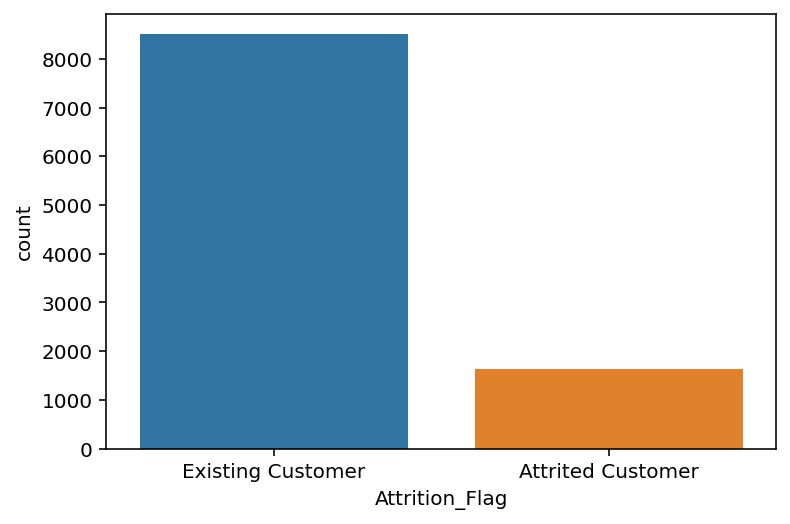

In [147]:
# visualization of the labels
sns.countplot(data['Attrition_Flag'])
plt.savefig('Attr.png')

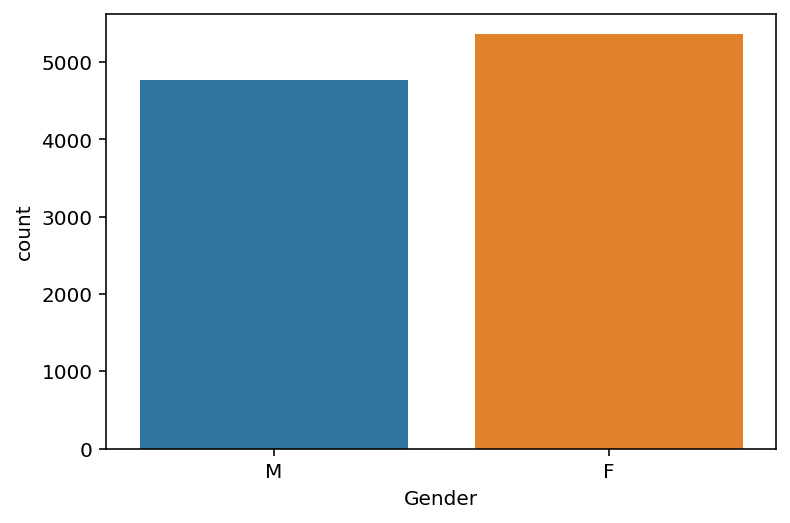

In [148]:
# gender
sns.countplot(data['Gender'])
plt.savefig("gender.png")

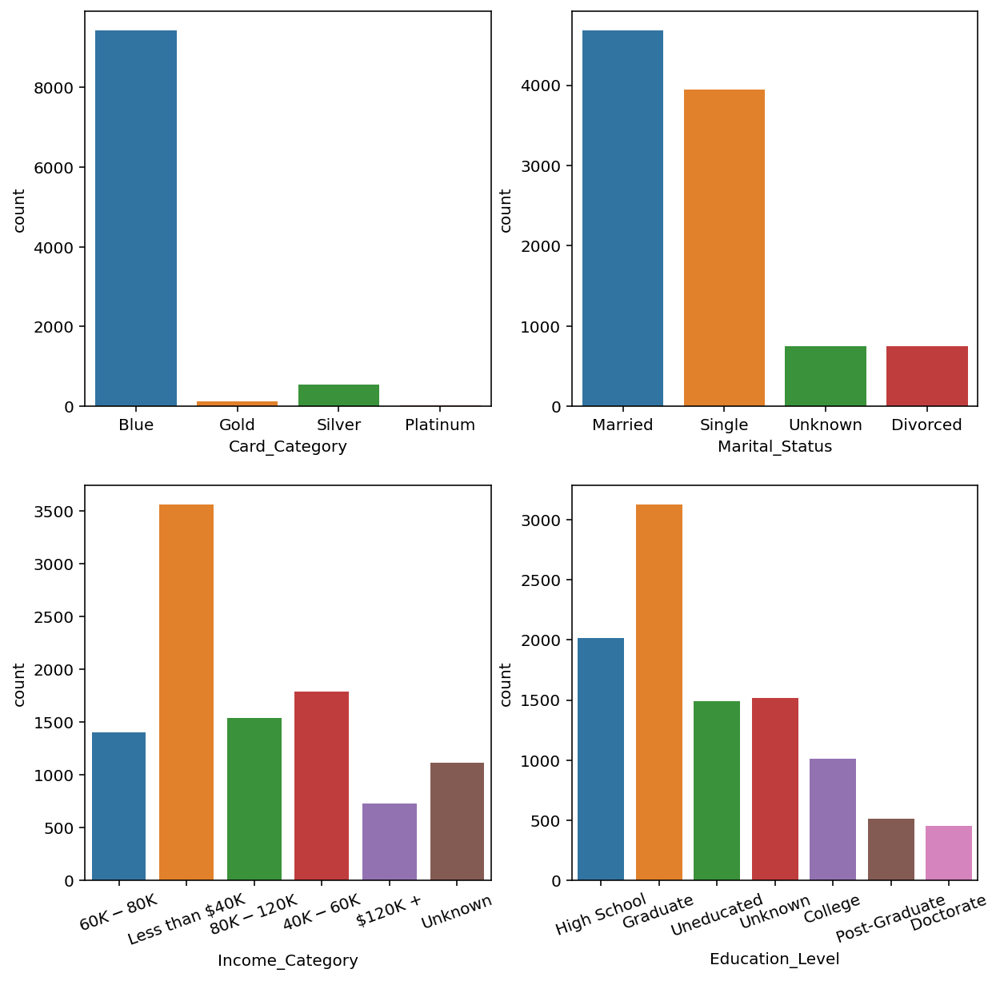

In [149]:
# other features in one plot
fig, ax = plt.subplots(2, 2, figsize = (10, 10))

f1 = sns.countplot(data['Education_Level'], ax = ax[1, 1])
f1.set_xticklabels(f1.get_xticklabels(), rotation = 20)
sns.countplot(data['Marital_Status'], ax = ax[0, 1])
f2 = sns.countplot(data['Income_Category'], ax = ax[1, 0])
f2.set_xticklabels(f2.get_xticklabels(), rotation = 20)
sns.countplot(data['Card_Category'], ax = ax[0, 0])

plt.savefig("other cat.png")

## Feature Engineering

### Categorical Features

In [30]:
data['Card_Category'].value_counts()

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

In [31]:
data['Marital_Status'].value_counts()

Married     4687
Single      3943
Unknown      749
Divorced     748
Name: Marital_Status, dtype: int64

In [32]:
# convert Male to 1, Female to 0
X['Gender'] = X['Gender'].replace(['F', 'M'], [0, 1])
# replace Gold, Silver, and Platinum in card category with Other
X['Card_Category'] = X['Card_Category'].replace(['Gold', 'Silver', 'Platinum'], 'Other')
# map divorce and other marital status into Other
X['Marital_Status'] = X['Marital_Status'].replace(['Unknown', 'Divorced'], 'Other')

#### One-hot Encoding

In [33]:
# Get a Pd.Series consisting of all the string categoricals
oh_cols = X.dtypes[X.dtypes == np.object]  # filtering by string categoricals
oh_cols = oh_cols.index.tolist()  # list of categorical fields
X[oh_cols].head().T

,0,1,2,3,4
Education_Level,High School,Graduate,Graduate,High School,Uneducated
Marital_Status,Married,Single,Married,Other,Married
Income_Category,$60K - $80K,Less than $40K,$80K - $120K,Less than $40K,$60K - $80K
Card_Category,Blue,Blue,Blue,Blue,Blue


In [34]:
X = pd.get_dummies(X, columns=oh_cols, drop_first=True)

### Feature Interaction

In [35]:
# average transaction amount
X1 = X.copy()
X1['Avg_Trans_Amt'] = X1['Total_Trans_Amt'] / X1['Total_Trans_Ct']

### Feature Distribution

In [36]:
# deviation of total transaction count
X1['Dev_Total_Trans_Ct'] = (abs(X1['Total_Trans_Ct'] 
                                    - X1['Total_Trans_Ct'].mean())
                                 * X1['Total_Trans_Ct'])
X1['Dev_Total_Trans_Ct'] = X1['Dev_Total_Trans_Ct'].apply(np.log1p)

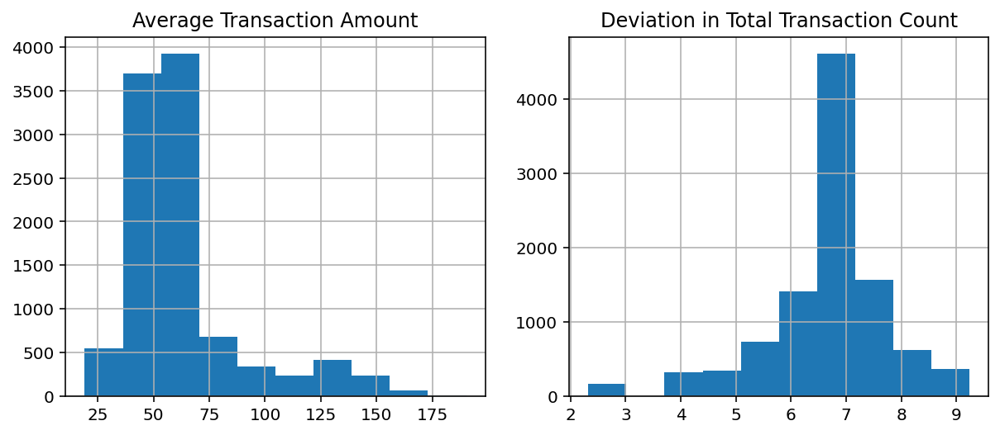

In [38]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 4))

X1['Avg_Trans_Amt'].hist(ax = ax1)
ax1.set_title('Average Transaction Amount')
X1['Dev_Total_Trans_Ct'].hist(ax = ax2)
ax2.set_title('Deviation in Total Transaction Count')

plt.savefig('new')

## Hypothesis Test

**Hypothesis I:** 

There is a relationship between customer attrition and total revolving balance on the credit card.

Step 1:

Run regression $$Y = \alpha + \beta X$$ where $Y$ is customer attrition flag and X is the total revolving balance.

Step 2:

$$H_0: \beta = 0$$
$$H_1: \beta \neq 0$$

Step 3: 

Compute $$tstat = \frac{\hat{\beta}}{SE(\hat\beta)}$$

In [40]:
# linear regression
import statsmodels.api as sm
x1 = data['Total_Revolving_Bal']
y1 = Ynum
x1 = sm.add_constant(x1)
lm1 = sm.OLS(y1, x1)
re1 = lm1.fit()

In [59]:
t_stat = re1.params[1] / re1.bse[1]
abs(t_stat)

27.435422507844986

**Hypothesis II:**

There is a relationship between customer arrtition and amount of total transaction.

In [41]:
x2 = data['Total_Trans_Amt']
y2 = Ynum
x2 = sm.add_constant(x2)
lm2 = sm.OLS(y2, x2)
re2 = lm2.fit()

In [42]:
t_stat2 = re2.params[1] / re1.bse[1]
abs(t_stat2)

4.218526448830397

In [43]:
re2.params

const              0.240927
Total_Trans_Amt   -0.000018
dtype: float64

In [44]:
re1.bse

const                  0.006135
Total_Revolving_Bal    0.000004
dtype: float64

**Hypothesis III:**

Customer age is normally distributed.


In [5]:
from scipy import stats
x3 = data['Customer_Age']
k2, p = stats.normaltest(x3)

In [6]:
alpha = 0.05
p
# p < alpha

1.3326027320307643e-11

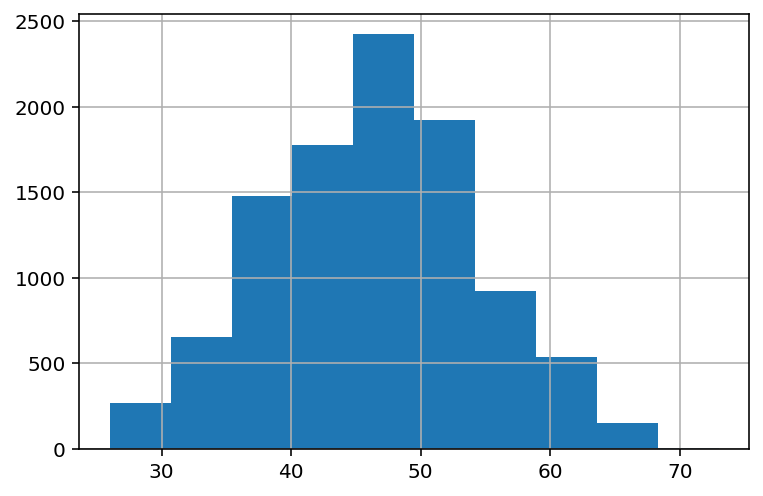

In [4]:
data['Customer_Age'].hist()